# Interactive map

### Sources: [Automating GIS-processes 2021](https://autogis-site.readthedocs.io/en/latest/lessons/L5/overview.html)

### Data available [here](https://github.com/dahlalex/website/tree/main/notebooks)

### The goal is to plot an interactive map of employment rates across Finnish sub-regions.

In [1]:
import folium
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
%matplotlib inline 

## 1- Read the data

In [2]:
# Employment rate refers to “the proportion of the employed among persons aged 15 to 64”
data = pd.read_csv(r"data/seutukunta_tyollisyys_2013.csv", sep=",")
data.head()

,seutukunta,seutukunta_nimi,tyollisyys
0,SK011,Helsingin seutukunta,73.0
1,SK014,Raaseporin seutukunta,70.3
2,SK015,Porvoon seutukunta,74.3
3,SK016,Loviisan seutukunta,71.5
4,SK021,Åboland-Turunmaan seutukunta,72.9


In [3]:
data.shape

(70, 3)

In [7]:
# Sub-regions (Seutukunnat in Finnish) in Finland
url = "http://geo.stat.fi/geoserver/tilastointialueet/wfs?request=GetFeature&typename=tilastointialueet:seutukunta1000k_2020&outputformat=JSON"
geodata = gpd.read_file(url)

In [8]:
geodata.head()

,id,seutukunta,vuosi,nimi,namn,name,geometry
0,seutukunta1000k_2020.1,011,2020,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969..."
1,seutukunta1000k_2020.2,014,2020,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668..."
2,seutukunta1000k_2020.3,015,2020,Porvoo,Borgå,Porvoo,"MULTIPOLYGON (((427108.141 6694151.025, 427175..."
3,seutukunta1000k_2020.4,016,2020,Loviisa,Lovisa,Loviisa,"MULTIPOLYGON (((444038.768 6703649.355, 444155..."
4,seutukunta1000k_2020.5,021,2020,Åboland-Turunmaa,Åboland-Turunmaa,Åboland-Turunmaa,"MULTIPOLYGON (((190999.717 6715878.622, 191021..."


In [9]:
geodata.shape

(70, 7)

## 2- Join attributes and geometries

In [10]:
# The region codes in the csv contain additional letters “SK” which we need to remove before the join

data["seutukunta"] = data["seutukunta"].apply(lambda x: x[2:])
data["seutukunta"].head()

0    011
1    014
2    015
3    016
4    021
Name: seutukunta, dtype: object

In [11]:
geodata = geodata.merge(data, on="seutukunta")

In [12]:
geodata.head()

,id,seutukunta,vuosi,nimi,namn,name,geometry,seutukunta_nimi,tyollisyys
0,seutukunta1000k_2020.1,011,2020,Helsinki,Helsingfors,Helsinki,"MULTIPOLYGON (((409963.522 6681658.341, 409969...",Helsingin seutukunta,73.0
1,seutukunta1000k_2020.2,014,2020,Raasepori,Raseborg,Raasepori,"MULTIPOLYGON (((306616.919 6665438.489, 306668...",Raaseporin seutukunta,70.3
2,seutukunta1000k_2020.3,015,2020,Porvoo,Borgå,Porvoo,"MULTIPOLYGON (((427108.141 6694151.025, 427175...",Porvoon seutukunta,74.3
3,seutukunta1000k_2020.4,016,2020,Loviisa,Lovisa,Loviisa,"MULTIPOLYGON (((444038.768 6703649.355, 444155...",Loviisan seutukunta,71.5
4,seutukunta1000k_2020.5,021,2020,Åboland-Turunmaa,Åboland-Turunmaa,Åboland-Turunmaa,"MULTIPOLYGON (((190999.717 6715878.622, 191021...",Åboland-Turunmaan seutukunta,72.9


<AxesSubplot:>

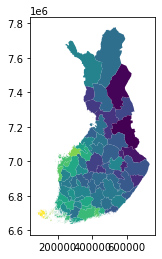

In [13]:
geodata.plot(column= "tyollisyys")

## 3- Plot the data

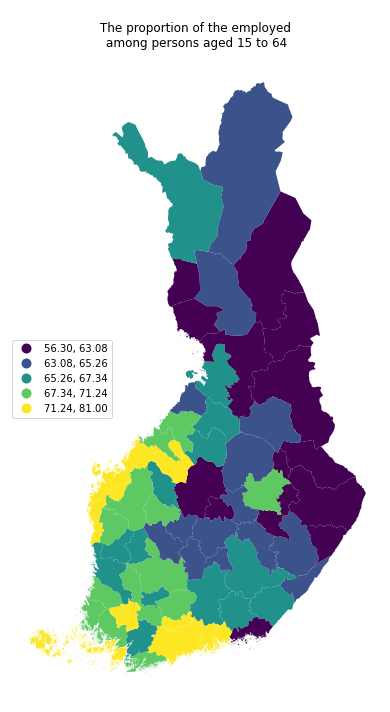

In [14]:
fig, ax = plt.subplots(figsize= (12, 12))

geodata.plot(ax=ax, column='tyollisyys', scheme="quantiles", cmap="viridis", legend= True,
             legend_kwds={'loc': 'center left'})
ax.set(title= '\n The proportion of the employed \n among persons aged 15 to 64')
ax.axis('off')
#plt.savefig('employement.png', dpi= 300, facecolor= 'white' )
plt.show()

## 4- Create an interactive map Using Folium library

In [15]:
# Create a Geo-id which is needed by the Folium (it needs to have a unique identifier for each row)
geodata['geoid'] = geodata.index.astype(str)

In [33]:
m = folium.Map(location=[65.32, 24.8],
              tiles='https://tile.jawg.io/jawg-light/{z}/{x}/{y}{r}.png?access-token=pS7VFeJMeMYINeXoOgfw2qMO9lzdGeiFZXhhqR5QasJkP5xe63w6EEJe0NpsKiHP',
              attr='jawg.io/jawg-light', zoom_start= 5, zoom_control=False, control_scale=True)

folium.Choropleth(geo_data=geodata, data=geodata, columns=['geoid', 'tyollisyys'], 
                 key_on='feature.id', 
                  fill_color='YlGnBu_r', 
                  line_color='white',
                  line_weight=0,
                  legend_name= 'Employment rate in Finland',

                 ).add_to(m)


folium.features.GeoJson(data=geodata, name='labels',
               style_function=lambda x: {'color':'transparent','fillColor':'transparent','weight':0},
                        highlight_function=lambda x: {'weight':2,'color':'red'},
                tooltip=folium.features.GeoJsonTooltip(fields=['name','tyollisyys'],
                                              aliases = ['Sub-region','Employment rate'],
                                              labels=True,
                                              sticky=False)
                       ).add_to(m)

folium.LayerControl().add_to(m)

In [34]:
m


In [35]:
outfb = "interactive_maps/Employment_rate_in_Finland.html"
m.save(outfb)